In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download -d vinayakshanawad/weedcrop-image-dataset

Dataset URL: https://www.kaggle.com/datasets/vinayakshanawad/weedcrop-image-dataset
License(s): CC0-1.0
 96% 242M/251M [00:02<00:00, 134MB/s]
100% 251M/251M [00:02<00:00, 117MB/s]


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/weedcrop-image-dataset.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.0/793.0 kB 4.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
import ultralytics

from ultralytics import YOLO
import os
from PIL import Image
import cv2
from IPython.display import Video
import glob
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [ ]:
ultralytics.checks()

Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.7/78.2 GB disk)


In [ ]:
model = YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 218MB/s]


In [ ]:
Root_dir = '/content/WeedCrop.v1i.yolov5pytorch'
yaml_path = os.path.join(Root_dir, '/content/WeedCrop.v1i.yolov5pytorch/data.yaml')
train_path = os.path.join(Root_dir, 'train', 'images')
valid_path = os.path.join(Root_dir, 'valid', 'images')

In [ ]:
results = model.train(
    data=yaml_path,
    epochs=15,  # Original number of epochs
    batch=8,  # Reduced batch size to avoid CPU overload
    lr0=0.0001,
    lrf=0.1,
    imgsz=640,
    save=True,  # Enable saving model checkpoints
    save_period=1  # Save the model after every epoch
)

Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/WeedCrop.v1i.yolov5pytorch/data.yaml, epochs=15, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

100%|██████████| 755k/755k [00:00<00:00, 24.1MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 122MB/s]


AMP: checks passed ✅


train: Scanning /content/WeedCrop.v1i.yolov5pytorch/train/labels... 2469 images, 101 backgrounds, 0 corrupt: 100%|██████████| 2469/2469 [00:05<00:00, 413.73it/s]


train: New cache created: /content/WeedCrop.v1i.yolov5pytorch/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/WeedCrop.v1i.yolov5pytorch/valid/labels... 235 images, 0 backgrounds, 0 corrupt: 100%|██████████| 235/235 [00:00<00:00, 335.34it/s]

val: New cache created: /content/WeedCrop.v1i.yolov5pytorch/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      2.46G      2.669      2.601      1.291         91        640: 100%|██████████| 309/309 [01:25<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.50it/s]

                   all        235       1605      0.384        0.4       0.33      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.41G       2.53      2.102      1.249         29        640: 100%|██████████| 309/309 [01:21<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.57it/s]

                   all        235       1605      0.324      0.421       0.29      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.39G      2.484      2.007      1.233         78        640: 100%|██████████| 309/309 [01:17<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.46it/s]


                   all        235       1605      0.593      0.482      0.497      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.39G      2.457      1.944      1.206         67        640: 100%|██████████| 309/309 [01:22<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.83it/s]

                   all        235       1605      0.409      0.572      0.428      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.42G      2.353      1.851      1.175         37        640: 100%|██████████| 309/309 [01:14<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.91it/s]

                   all        235       1605      0.631      0.529      0.572      0.279


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.39G      2.296      1.798      1.198         22        640: 100%|██████████| 309/309 [01:20<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.17it/s]

                   all        235       1605      0.539      0.527      0.511      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.38G      2.229      1.718      1.176         26        640: 100%|██████████| 309/309 [01:15<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:02<00:00,  5.12it/s]


                   all        235       1605      0.453      0.476      0.469      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15       2.4G      2.157      1.639       1.15         23        640: 100%|██████████| 309/309 [01:16<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.32it/s]

                   all        235       1605      0.572      0.587      0.604      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.38G      2.121      1.568      1.139         22        640: 100%|██████████| 309/309 [01:18<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.76it/s]

                   all        235       1605      0.513      0.519        0.5      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      2.39G       2.07      1.557      1.114         25        640: 100%|██████████| 309/309 [01:14<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:02<00:00,  5.17it/s]


                   all        235       1605      0.576      0.616      0.564      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      2.36G      2.017      1.511      1.111         37        640: 100%|██████████| 309/309 [01:18<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.96it/s]

                   all        235       1605      0.624       0.64       0.66      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      2.39G      1.986       1.46      1.098         21        640: 100%|██████████| 309/309 [01:14<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.65it/s]


                   all        235       1605      0.537      0.534      0.556      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      2.38G      1.951      1.441      1.087         21        640: 100%|██████████| 309/309 [01:14<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.88it/s]


                   all        235       1605       0.59      0.582      0.617      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      2.39G      1.918      1.382      1.078         33        640: 100%|██████████| 309/309 [01:15<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.28it/s]

                   all        235       1605      0.598      0.597      0.601      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      2.38G      1.876       1.35      1.059         23        640: 100%|██████████| 309/309 [01:14<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.26it/s]

                   all        235       1605      0.563       0.66      0.603      0.337



15 epochs completed in 0.348 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:06<00:00,  2.15it/s]


                   all        235       1605       0.59      0.583      0.618      0.349
                  crop         17         47       0.52      0.617      0.598      0.372
                  weed        228       1558      0.659      0.548      0.637      0.326
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/train



0: 384x640 1 weed, 17.5ms
Speed: 2.2ms preprocess, 17.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


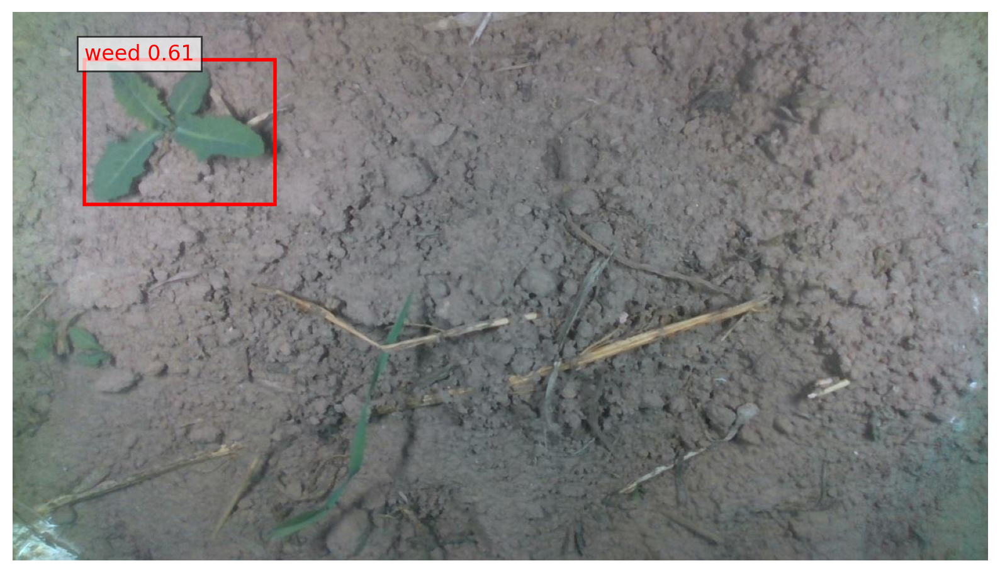


0: 384x640 6 weeds, 10.6ms
Speed: 1.9ms preprocess, 10.6ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)


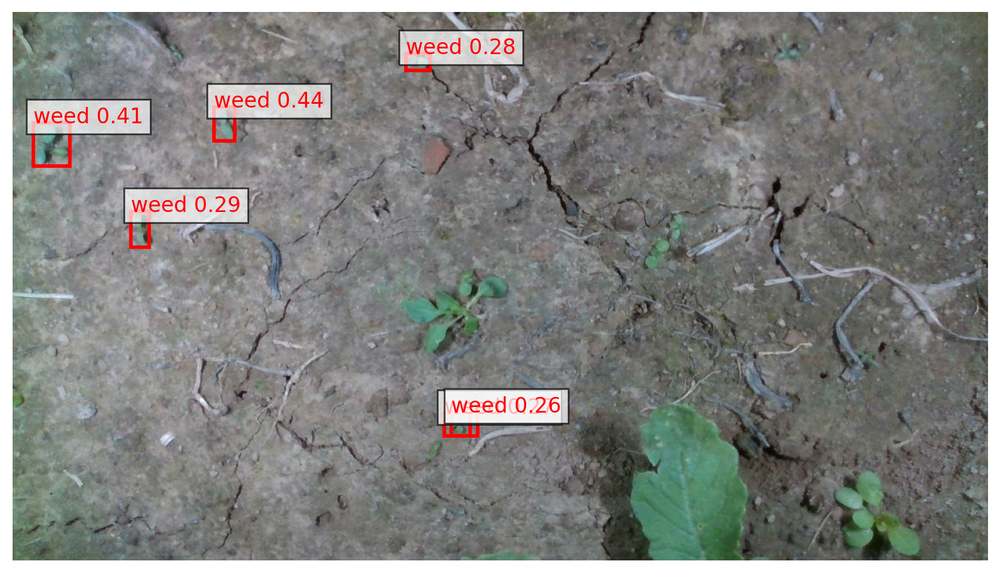


0: 384x640 (no detections), 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


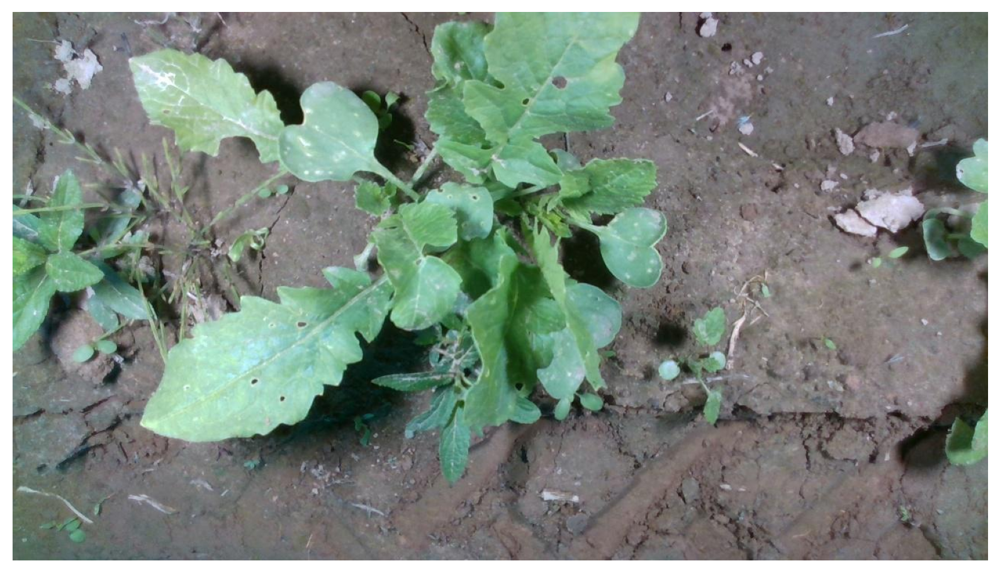


0: 480x640 1 crop, 1 weed, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


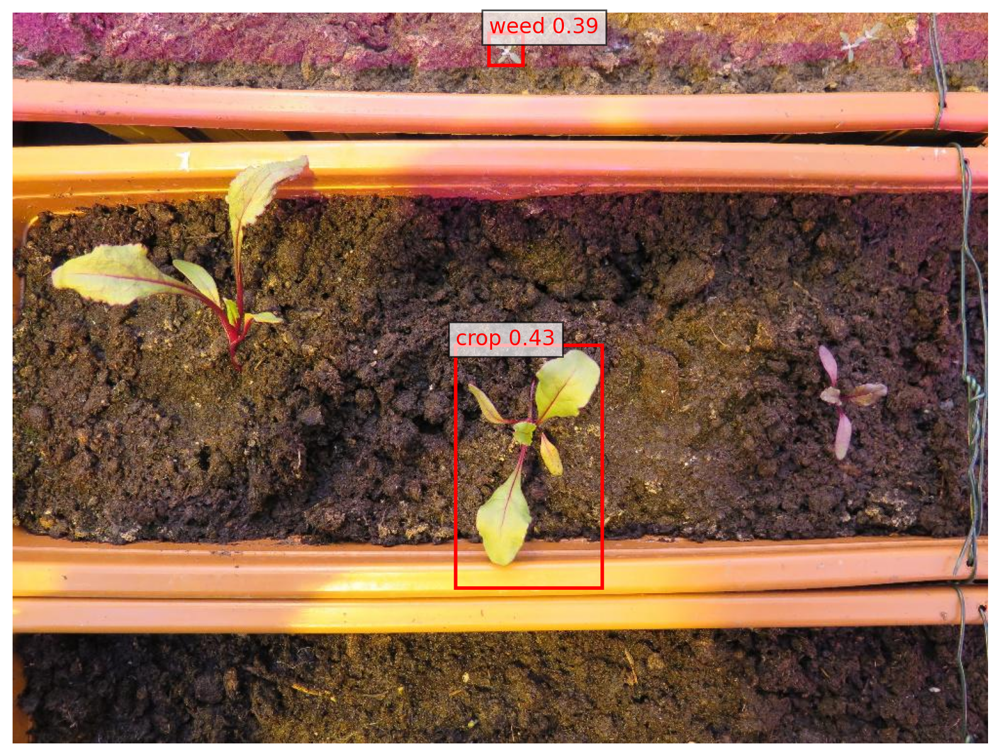


0: 384x640 15 weeds, 12.8ms
Speed: 1.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


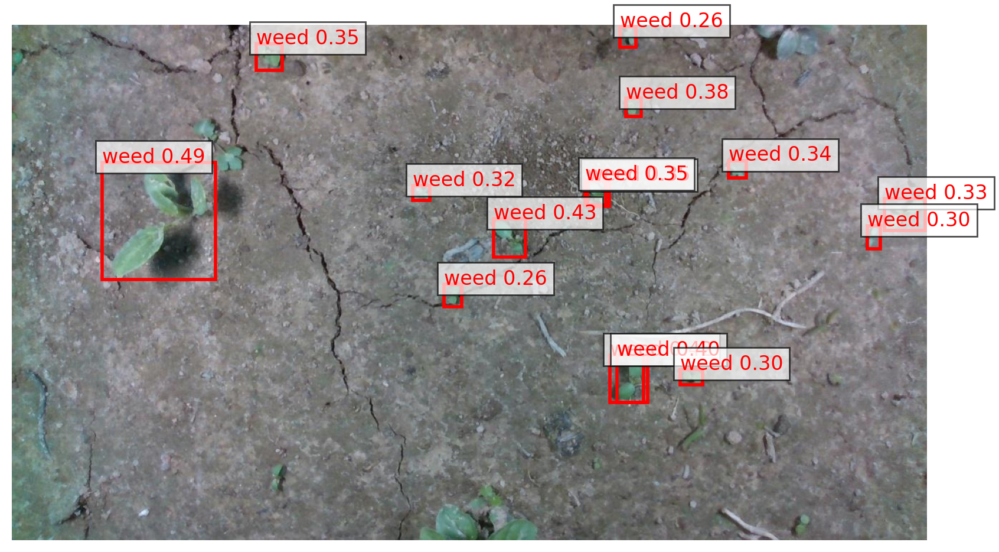

In [ ]:
# Display and perform object detection on images from the validation directory
data_dir = os.path.join(Root_dir, 'valid', 'images')
img_dir = os.path.join(data_dir, '*g')
files = glob.glob(img_dir)
for image in files[:5]:  # Limit to the first 5 images to avoid CPU overload
    img = cv2.imread(image)
    results = model(img)  # Perform object detection

    # Convert BGR to RGB for displaying with matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot the image with detections
    plt.figure(figsize=(10, 10), dpi=200)
    plt.imshow(img_rgb)
    plt.axis('off')

    # Draw bounding boxes and labels if detected
    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
            conf = box.conf[0].item()
            cls = int(box.cls[0].item())
            label = model.names[cls]
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='red', facecolor='none'))
            plt.text(x1, y1, f'{label} {conf:.2f}', color='red', fontsize=12, bbox=dict(facecolor='white', alpha=0.7))

    plt.show()